In [1]:
"""
Copyright 2022 Huawei Technologies Co., Ltd

CREATED:  2020-6-04 20:12:13
MODIFIED: 2022-12-20 11:48:45
"""

# -*- coding:utf-8 -*-
%matplotlib inline
import numpy as np
import os, sys, cv2, matplotlib
#
from os import path
from PIL import Image
from src.model import preprocess
from src.postprocessing import draw_label
# define acllite library path
sys.path.append('../../Common/acllite')
# modules of acllite library
from constants import IMG_EXT
from acllite_model import AclLiteModel
from acllite_resource import AclLiteResource

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
# define device id & model path
device_id = 0
model_path = './model/deeplabv3plus513_310.om'

# define image & output paths
img_path = "data/test.jpg"
output_path = "data/out/"

In [4]:
# initialize acllite library
acl_resource = AclLiteResource(device_id)
acl_resource.init()
print('[Device] NPU Device id:',acl_resource.device_id)
# load *.om model
model = AclLiteModel(model_path)

init resource stage:
Init resource success
[Device] NPU Device id: 0
Init model resource start...
[AclLiteModel] create model output dataset:
malloc output 0, size 11053098
Create model output dataset success
Init model resource success


In [5]:
# read image
img_bgr = cv2.imread(img_path)

In [6]:
# 1) pre-processing stage
input_data = preprocess(img_bgr, model._model_desc)

model input size 1
input  0
model input dims ({'name': 'actual_input_1', 'dimCount': 4, 'dims': [1, 3, 513, 513]}, 0)
model input datatype 0
model output size 1
output  0
model output dims ({'name': 'PartitionedCall_Resize_429_ResizeBilinearV2_28:0:output1', 'dimCount': 4, 'dims': [1, 21, 513, 513]}, 0)
model output datatype 1
[Model] class Model init resource stage success


In [7]:
%timeit -n 10 -r 3
result_list = model.execute([input_data,]) # 2) model execution(forward) stage

In [8]:
fig = draw_label(img_bgr, result_list[0].squeeze(), path.join(output_path, path.split(img_path)[1]))

Image saved into output path . . .


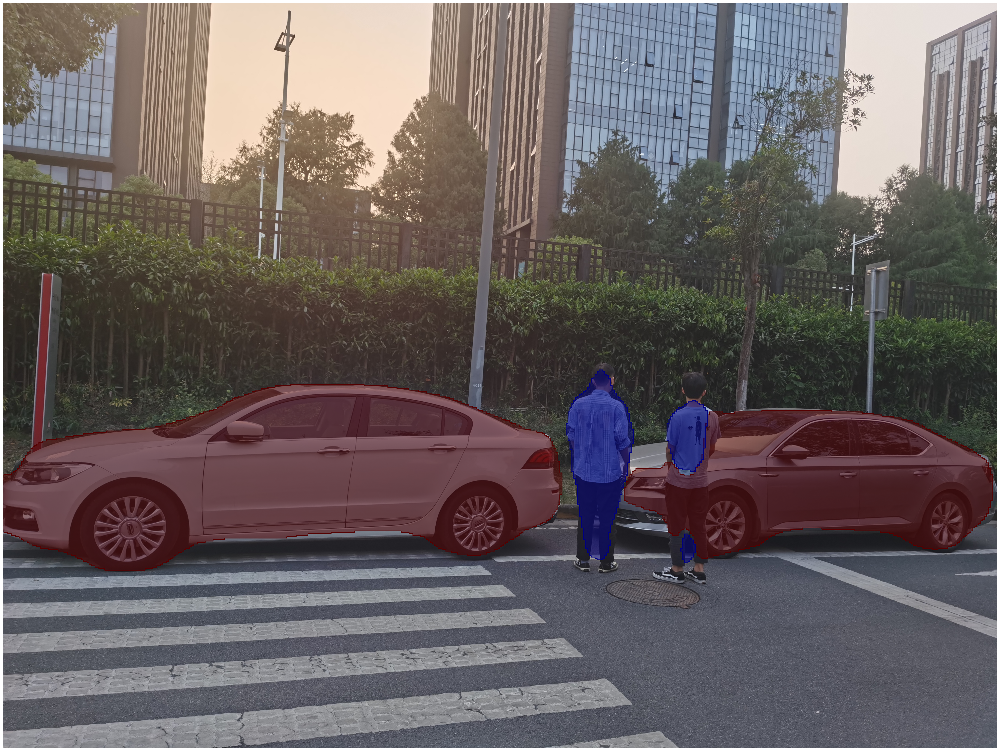

In [9]:
fig